# GauGAN for conditional image generation

**Author:** [Soumik Rakshit](https://github.com/soumik12345), [Sayak Paul](https://twitter.com/RisingSayak)<br>
**Date created:** 2021/12/26<br>
**Last modified:** 2022/01/03<br>
**Description:** Implementing a GauGAN for conditional image generation.

In [ ]:
# https://keras.io/examples/generative/gaugan/

In [1]:
import os
import datetime
import random
import itertools
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt

import tensorflow as tf
import tensorflow_addons as tfa
from tensorflow import keras
from tensorflow.keras import layers

from glob import glob
from PIL import Image

2023-04-19 00:11:43.233683: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-04-19 00:11:43.637710: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
/home/klima7/anaconda3/envs/tensorflow/lib/python3.10/site-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


In [2]:
BATCH_SIZE = 7
NUM_CLASSES = 25
IMG_HEIGHT = IMG_WIDTH = 256

In [3]:

class SPADE(layers.Layer):
    def __init__(self, filters, epsilon=1e-5, **kwargs):
        super().__init__(**kwargs)
        self.epsilon = epsilon
        self.conv = layers.Conv2D(128, 3, padding="same", activation="relu")
        self.conv_gamma = layers.Conv2D(filters, 3, padding="same")
        self.conv_beta = layers.Conv2D(filters, 3, padding="same")

    def build(self, input_shape):
        self.resize_shape = input_shape[1:3]

    def call(self, input_tensor, raw_mask):
        mask = tf.image.resize(raw_mask, self.resize_shape, method="nearest")
        x = self.conv(mask)
        gamma = self.conv_gamma(x)
        beta = self.conv_beta(x)
        mean, var = tf.nn.moments(input_tensor, axes=(0, 1, 2), keepdims=True)
        std = tf.sqrt(var + self.epsilon)
        normalized = (input_tensor - mean) / std
        output = gamma * normalized + beta
        return output


class ResBlock(layers.Layer):
    def __init__(self, filters, **kwargs):
        super().__init__(**kwargs)
        self.filters = filters

    def build(self, input_shape):
        input_filter = input_shape[-1]
        self.spade_1 = SPADE(input_filter)
        self.spade_2 = SPADE(self.filters)
        self.conv_1 = layers.Conv2D(self.filters, 3, padding="same")
        self.conv_2 = layers.Conv2D(self.filters, 3, padding="same")
        self.learned_skip = False

        if self.filters != input_filter:
            self.learned_skip = True
            self.spade_3 = SPADE(input_filter)
            self.conv_3 = layers.Conv2D(self.filters, 3, padding="same")

    def call(self, input_tensor, mask):
        # print('ResBlock', mask.shape)
        x = self.spade_1(input_tensor, mask)
        x = self.conv_1(tf.nn.leaky_relu(x, 0.2))
        x = self.spade_2(x, mask)
        x = self.conv_2(tf.nn.leaky_relu(x, 0.2))
        skip = (
            self.conv_3(tf.nn.leaky_relu(self.spade_3(input_tensor, mask), 0.2))
            if self.learned_skip
            else input_tensor
        )
        output = skip + x
        return output


class GaussianSampler(layers.Layer):
    def __init__(self, batch_size, latent_dim, **kwargs):
        super().__init__(**kwargs)
        self.batch_size = batch_size
        self.latent_dim = latent_dim

    def call(self, inputs):
        means, variance = inputs
        epsilon = tf.random.normal(
            shape=(self.batch_size, self.latent_dim), mean=0.0, stddev=1.0
        )
        samples = means + tf.exp(0.5 * variance) * epsilon
        return samples


In [4]:

def downsample(
    channels,
    kernels,
    strides=2,
    apply_norm=True,
    apply_activation=True,
    apply_dropout=False,
):
    block = keras.Sequential()
    block.add(
        layers.Conv2D(
            channels,
            kernels,
            strides=strides,
            padding="same",
            use_bias=False,
            kernel_initializer=keras.initializers.GlorotNormal(),
        )
    )
    if apply_norm:
        block.add(tfa.layers.InstanceNormalization())
    if apply_activation:
        block.add(layers.LeakyReLU(0.2))
    if apply_dropout:
        block.add(layers.Dropout(0.5))
    return block


In [5]:

def build_encoder(image_shape, encoder_downsample_factor=64, latent_dim=256):
    input_image = keras.Input(shape=image_shape)
    x = downsample(encoder_downsample_factor, 3, apply_norm=False)(input_image)
    x = downsample(2 * encoder_downsample_factor, 3)(x)
    x = downsample(4 * encoder_downsample_factor, 3)(x)
    x = downsample(8 * encoder_downsample_factor, 3)(x)
    x = downsample(8 * encoder_downsample_factor, 3)(x)
    x = layers.Flatten()(x)
    mean = layers.Dense(latent_dim, name="mean")(x)
    variance = layers.Dense(latent_dim, name="variance")(x)
    return keras.Model(input_image, [mean, variance], name="encoder")


In [6]:

def build_generator(mask_shape, latent_dim=256):
    latent = keras.Input(shape=(latent_dim))
    mask = keras.Input(shape=mask_shape)
    x = layers.Dense(16384)(latent)
    x = layers.Reshape((4, 4, 1024))(x)
    x = ResBlock(filters=1024)(x, mask)
    x = layers.UpSampling2D((2, 2))(x)
    x = ResBlock(filters=1024)(x, mask)
    x = layers.UpSampling2D((2, 2))(x)
    x = ResBlock(filters=1024)(x, mask)
    x = layers.UpSampling2D((2, 2))(x)
    x = ResBlock(filters=512)(x, mask)
    x = layers.UpSampling2D((2, 2))(x)
    x = ResBlock(filters=256)(x, mask)
    x = layers.UpSampling2D((2, 2))(x)
    x = ResBlock(filters=128)(x, mask)
    x = layers.UpSampling2D((2, 2))(x)
    x = tf.nn.leaky_relu(x, 0.2)
    output_image = tf.nn.tanh(layers.Conv2D(3, 4, padding="same")(x))
    return keras.Model([latent, mask], output_image, name="generator")


In [7]:

def build_discriminator(image_shape, downsample_factor=64):
    input_image_A = keras.Input(shape=image_shape, name="discriminator_image_A")
    input_image_B = keras.Input(shape=image_shape, name="discriminator_image_B")
    x = layers.Concatenate()([input_image_A, input_image_B])
    x1 = downsample(downsample_factor, 4, apply_norm=False)(x)
    x2 = downsample(2 * downsample_factor, 4)(x1)
    x3 = downsample(4 * downsample_factor, 4)(x2)
    x4 = downsample(8 * downsample_factor, 4, strides=1)(x3)
    x5 = layers.Conv2D(1, 4)(x4)
    outputs = [x1, x2, x3, x4, x5]
    return keras.Model([input_image_A, input_image_B], outputs)


In [8]:

def generator_loss(y):
    return -tf.reduce_mean(y)


def kl_divergence_loss(mean, variance):
    return -0.5 * tf.reduce_sum(1 + variance - tf.square(mean) - tf.exp(variance))


class FeatureMatchingLoss(keras.losses.Loss):
    def __init__(self, **kwargs):
        super().__init__(**kwargs)
        self.mae = keras.losses.MeanAbsoluteError()

    def call(self, y_true, y_pred):
        loss = 0
        for i in range(len(y_true) - 1):
            loss += self.mae(y_true[i], y_pred[i])
        return loss


class VGGFeatureMatchingLoss(keras.losses.Loss):
    def __init__(self, **kwargs):
        super().__init__(**kwargs)
        self.encoder_layers = [
            "block1_conv1",
            "block2_conv1",
            "block3_conv1",
            "block4_conv1",
            "block5_conv1",
        ]
        self.weights = [1.0 / 32, 1.0 / 16, 1.0 / 8, 1.0 / 4, 1.0]
        vgg = keras.applications.VGG19(include_top=False, weights="imagenet")
        layer_outputs = [vgg.get_layer(x).output for x in self.encoder_layers]
        self.vgg_model = keras.Model(vgg.input, layer_outputs, name="VGG")
        self.mae = keras.losses.MeanAbsoluteError()

    def call(self, y_true, y_pred):
        y_true = keras.applications.vgg19.preprocess_input(127.5 * (y_true + 1))
        y_pred = keras.applications.vgg19.preprocess_input(127.5 * (y_pred + 1))
        real_features = self.vgg_model(y_true)
        fake_features = self.vgg_model(y_pred)
        loss = 0
        for i in range(len(real_features)):
            loss += self.weights[i] * self.mae(real_features[i], fake_features[i])
        return loss


class DiscriminatorLoss(keras.losses.Loss):
    def __init__(self, **kwargs):
        super().__init__(**kwargs)
        self.hinge_loss = keras.losses.Hinge()

    def call(self, y, is_real):
        label = 1.0 if is_real else -1.0
        return self.hinge_loss(label, y)


In [9]:

class GauGAN(keras.Model):
    def __init__(
        self,
        image_size,
        num_classes,
        batch_size,
        latent_dim,
        feature_loss_coeff=10,
        vgg_feature_loss_coeff=0.1,
        kl_divergence_loss_coeff=0.1,
        **kwargs,
    ):
        super().__init__(**kwargs)

        self.image_size = image_size
        self.latent_dim = latent_dim
        self.batch_size = batch_size
        self.num_classes = num_classes
        self.image_shape = (image_size, image_size, 3)
        self.mask_shape = (image_size, image_size, num_classes)
        self.feature_loss_coeff = feature_loss_coeff
        self.vgg_feature_loss_coeff = vgg_feature_loss_coeff
        self.kl_divergence_loss_coeff = kl_divergence_loss_coeff

        self.discriminator = build_discriminator(self.image_shape)
        self.generator = build_generator(self.mask_shape)
        self.encoder = build_encoder(self.image_shape)
        self.sampler = GaussianSampler(batch_size, latent_dim)
        self.patch_size, self.combined_model = self.build_combined_generator()

        self.disc_loss_tracker = tf.keras.metrics.Mean(name="disc_loss")
        self.gen_loss_tracker = tf.keras.metrics.Mean(name="gen_loss")
        self.feat_loss_tracker = tf.keras.metrics.Mean(name="feat_loss")
        self.vgg_loss_tracker = tf.keras.metrics.Mean(name="vgg_loss")
        self.kl_loss_tracker = tf.keras.metrics.Mean(name="kl_loss")

    @property
    def metrics(self):
        return [
            self.disc_loss_tracker,
            self.gen_loss_tracker,
            self.feat_loss_tracker,
            self.vgg_loss_tracker,
            self.kl_loss_tracker,
        ]

    def build_combined_generator(self):
        # This method builds a model that takes as inputs the following:
        # latent vector, one-hot encoded segmentation label map, and
        # a segmentation map. It then (i) generates an image with the generator,
        # (ii) passes the generated images and segmentation map to the discriminator.
        # Finally, the model produces the following outputs: (a) discriminator outputs,
        # (b) generated image.
        # We will be using this model to simplify the implementation.
        self.discriminator.trainable = False
        mask_input = keras.Input(shape=self.mask_shape, name="mask")
        image_input = keras.Input(shape=self.image_shape, name="image")
        latent_input = keras.Input(shape=(self.latent_dim), name="latent")
        generated_image = self.generator([latent_input, mask_input])
        discriminator_output = self.discriminator([image_input, generated_image])
        patch_size = discriminator_output[-1].shape[1]
        combined_model = keras.Model(
            [latent_input, mask_input, image_input],
            [discriminator_output, generated_image],
        )
        return patch_size, combined_model

    def compile(self, gen_lr=1e-4, disc_lr=4e-4, **kwargs):
        super().compile(**kwargs)
        self.generator_optimizer = keras.optimizers.Adam(
            gen_lr, beta_1=0.0, beta_2=0.999
        )
        self.discriminator_optimizer = keras.optimizers.Adam(
            disc_lr, beta_1=0.0, beta_2=0.999
        )
        self.discriminator_loss = DiscriminatorLoss()
        self.feature_matching_loss = FeatureMatchingLoss()
        self.vgg_loss = VGGFeatureMatchingLoss()

    def train_discriminator(self, latent_vector, segmentation_map, real_image, labels):
        fake_images = self.generator([latent_vector, labels])
        with tf.GradientTape() as gradient_tape:
            pred_fake = self.discriminator([segmentation_map, fake_images])[-1]
            pred_real = self.discriminator([segmentation_map, real_image])[-1]
            loss_fake = self.discriminator_loss(pred_fake, False)
            loss_real = self.discriminator_loss(pred_real, True)
            total_loss = 0.5 * (loss_fake + loss_real)

        self.discriminator.trainable = True
        gradients = gradient_tape.gradient(
            total_loss, self.discriminator.trainable_variables
        )
        self.discriminator_optimizer.apply_gradients(
            zip(gradients, self.discriminator.trainable_variables)
        )
        return total_loss

    def train_generator(
        self, latent_vector, segmentation_map, labels, image, mean, variance
    ):
        # Generator learns through the signal provided by the discriminator. During
        # backpropagation, we only update the generator parameters.
        self.discriminator.trainable = False
        with tf.GradientTape() as tape:
            real_d_output = self.discriminator([segmentation_map, image])
            fake_d_output, fake_image = self.combined_model(
                [latent_vector, labels, segmentation_map]
            )
            pred = fake_d_output[-1]

            # Compute generator losses.
            g_loss = generator_loss(pred)
            kl_loss = self.kl_divergence_loss_coeff * kl_divergence_loss(mean, variance)
            vgg_loss = self.vgg_feature_loss_coeff * self.vgg_loss(image, fake_image)
            feature_loss = self.feature_loss_coeff * self.feature_matching_loss(
                real_d_output, fake_d_output
            )
            total_loss = g_loss + kl_loss + vgg_loss + feature_loss

        all_trainable_variables = (
            self.combined_model.trainable_variables + self.encoder.trainable_variables
        )

        gradients = tape.gradient(total_loss, all_trainable_variables)
        self.generator_optimizer.apply_gradients(
            zip(gradients, all_trainable_variables)
        )
        return total_loss, feature_loss, vgg_loss, kl_loss

    def train_step(self, data):
        segmentation_map, image, labels = data
        mean, variance = self.encoder(image)
        latent_vector = self.sampler([mean, variance])
        discriminator_loss = self.train_discriminator(
            latent_vector, segmentation_map, image, labels
        )
        (generator_loss, feature_loss, vgg_loss, kl_loss) = self.train_generator(
            latent_vector, segmentation_map, labels, image, mean, variance
        )

        # Report progress.
        self.disc_loss_tracker.update_state(discriminator_loss)
        self.gen_loss_tracker.update_state(generator_loss)
        self.feat_loss_tracker.update_state(feature_loss)
        self.vgg_loss_tracker.update_state(vgg_loss)
        self.kl_loss_tracker.update_state(kl_loss)
        results = {m.name: m.result() for m in self.metrics}
        return results

    def test_step(self, data):
        segmentation_map, image, labels = data
        # Obtain the learned moments of the real image distribution.
        mean, variance = self.encoder(image)

        # Sample a latent from the distribution defined by the learned moments.
        latent_vector = self.sampler([mean, variance])

        # Generate the fake images.
        fake_images = self.generator([latent_vector, labels])

        # Calculate the losses.
        pred_fake = self.discriminator([segmentation_map, fake_images])[-1]
        pred_real = self.discriminator([segmentation_map, image])[-1]
        loss_fake = self.discriminator_loss(pred_fake, False)
        loss_real = self.discriminator_loss(pred_real, True)
        total_discriminator_loss = 0.5 * (loss_fake + loss_real)
        real_d_output = self.discriminator([segmentation_map, image])
        fake_d_output, fake_image = self.combined_model(
            [latent_vector, labels, segmentation_map]
        )
        pred = fake_d_output[-1]
        g_loss = generator_loss(pred)
        kl_loss = self.kl_divergence_loss_coeff * kl_divergence_loss(mean, variance)
        vgg_loss = self.vgg_feature_loss_coeff * self.vgg_loss(image, fake_image)
        feature_loss = self.feature_loss_coeff * self.feature_matching_loss(
            real_d_output, fake_d_output
        )
        total_generator_loss = g_loss + kl_loss + vgg_loss + feature_loss

        # Report progress.
        self.disc_loss_tracker.update_state(total_discriminator_loss)
        self.gen_loss_tracker.update_state(total_generator_loss)
        self.feat_loss_tracker.update_state(feature_loss)
        self.vgg_loss_tracker.update_state(vgg_loss)
        self.kl_loss_tracker.update_state(kl_loss)
        results = {m.name: m.result() for m in self.metrics}
        return results

    def call(self, inputs):
        latent_vectors, labels = inputs
        return self.generator([latent_vectors, labels])


In [10]:
from einops import rearrange

class GanMonitor(keras.callbacks.Callback):
    def __init__(self, dataset, interval=1):
        self.interval = interval
        self.dataset = itertools.cycle(dataset)
        self.counter = 0
        self.epoch = 0
        
    def on_epoch_begin(self, epoch, logs=None):
        self.epoch = epoch

    def on_train_batch_begin(self, batch, logs=None):
        if batch % self.interval != 0:
            return
        
        segmaps, images, labels = next(self.dataset)
        latent_vector = tf.random.normal( shape=(self.model.batch_size, self.model.latent_dim), mean=0.0, stddev=2.0)
        generated_images = self.model.predict([latent_vector, labels], verbose=0)
        
        images = images / 2 + 0.5
        segmaps = segmaps / 2 + 0.5
        generated_images = generated_images / 2 + 0.5
        
        parts = []
        for idx in range(len(images)):
            parts.extend([segmaps[idx], images[idx], generated_images[idx]])
        parts = np.array(parts)
        combined_image = rearrange(parts, '(nh nw) h w c -> (nh h) (nw w) c', nh=len(images), nw=3)
                
        description = f'Epoch {self.epoch} step {batch}'
        tf.summary.image('train_samples_single', combined_image[:IMG_HEIGHT, ...][np.newaxis, ...], step=self.counter, description=description)
        tf.summary.image('train_samples_multiple', combined_image[np.newaxis, ...], step=self.counter, description=description)
        self.counter += 1

## Dataset

In [11]:
from dataset import DataIterator

images = np.load('data/ADE20K/images.npy').astype(np.float32) / 127.5 - 1
segmaps = (np.load('data/ADE20K/segmaps.npy')).astype(np.float32) * 2 - 1
labels = np.load('data/ADE20K/24_classes.npy').astype(np.float32)

In [12]:
# images = images[:50]
# segmaps = segmaps[:50]
# labels = labels[:50]

In [13]:
from keras.utils import to_categorical

def shuffle_dataset():
    global images, segmaps, labels
    idx = np.arange(len(images))
    np.random.shuffle(idx)
    images = images[idx]
    segmaps = segmaps[idx]
    labels = labels[idx]

def dataset_generator():
    idx = np.arange(len(images))
    np.random.shuffle(idx)
    
    full_batches_count = len(images) // BATCH_SIZE
    for batch_no in range(full_batches_count):
        idx_batch = idx[batch_no * BATCH_SIZE: (batch_no + 1) * BATCH_SIZE]
        _segmaps = segmaps[idx_batch]
        _images = images[idx_batch]
        _labels = to_categorical(labels[idx_batch], NUM_CLASSES)
        yield _segmaps, _images, _labels

dataset = tf.data.Dataset.from_generator(
    dataset_generator, 
    output_types=(tf.float32, tf.float32, tf.float32),
    output_shapes=(
        (BATCH_SIZE, IMG_HEIGHT, IMG_WIDTH, 3),
        (BATCH_SIZE, IMG_HEIGHT, IMG_WIDTH, 3),
        (BATCH_SIZE, IMG_HEIGHT, IMG_WIDTH, NUM_CLASSES)
    )
)

2023-04-19 00:11:54.318687: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-04-19 00:11:54.333818: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-04-19 00:11:54.333972: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

## GauGan Training

In [14]:
log_dir = "logs/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
file_writer = tf.summary.create_file_writer(log_dir + "/metrics")
file_writer.set_as_default()

In [14]:
gaugan = GauGAN(IMG_HEIGHT, NUM_CLASSES, BATCH_SIZE, latent_dim=256)
gaugan.compile()

In [ ]:
gaugan = tf.keras.models.load_model('checkpoints/05.tf')
gaugan.batch_size = BATCH_SIZE
gaugan.latent_dim = 256

In [ ]:
from tensorflow.keras.callbacks import TensorBoard, ModelCheckpoint

tensorboard_callback = TensorBoard(log_dir=log_dir)
checkpoint_callback = ModelCheckpoint(
    filepath='checkpoints/{epoch:02d}.tf',
    save_weights_only=False,
    save_best_only=False,
)

history = gaugan.fit(
    dataset,
    # validation_data=dataset,
    epochs=15,
    callbacks=[tensorboard_callback, checkpoint_callback, GanMonitor(dataset, interval=50)],
)


def plot_history(item):
    plt.plot(history.history[item], label=item)
    plt.plot(history.history["val_" + item], label="val_" + item)
    plt.xlabel("Epochs")
    plt.ylabel(item)
    plt.title("Train and Validation {} Over Epochs".format(item), fontsize=14)
    plt.legend()
    plt.grid()
    plt.show()


plot_history("disc_loss")
plot_history("gen_loss")
plot_history("feat_loss")
plot_history("vgg_loss")
plot_history("kl_loss")

## Inference

1/1 [==============================] - 0s 32ms/step


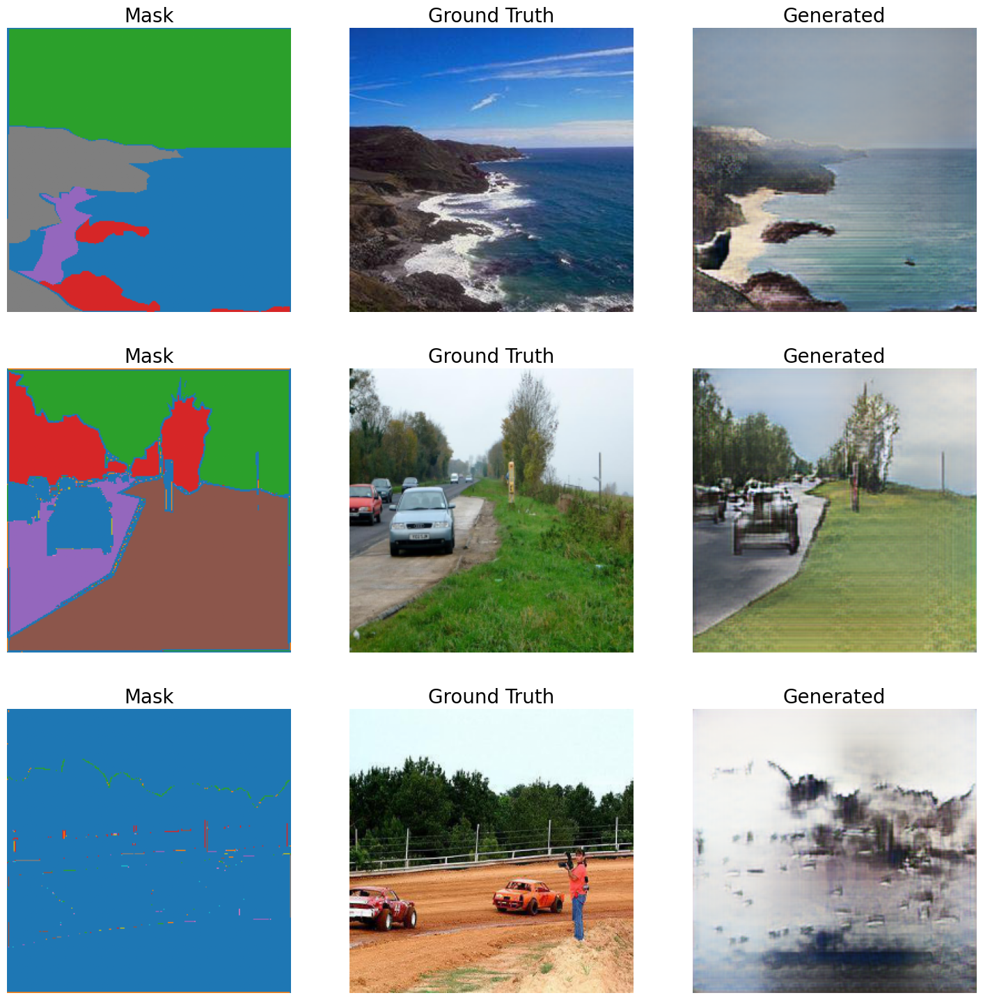

1/1 [==============================] - 0s 38ms/step


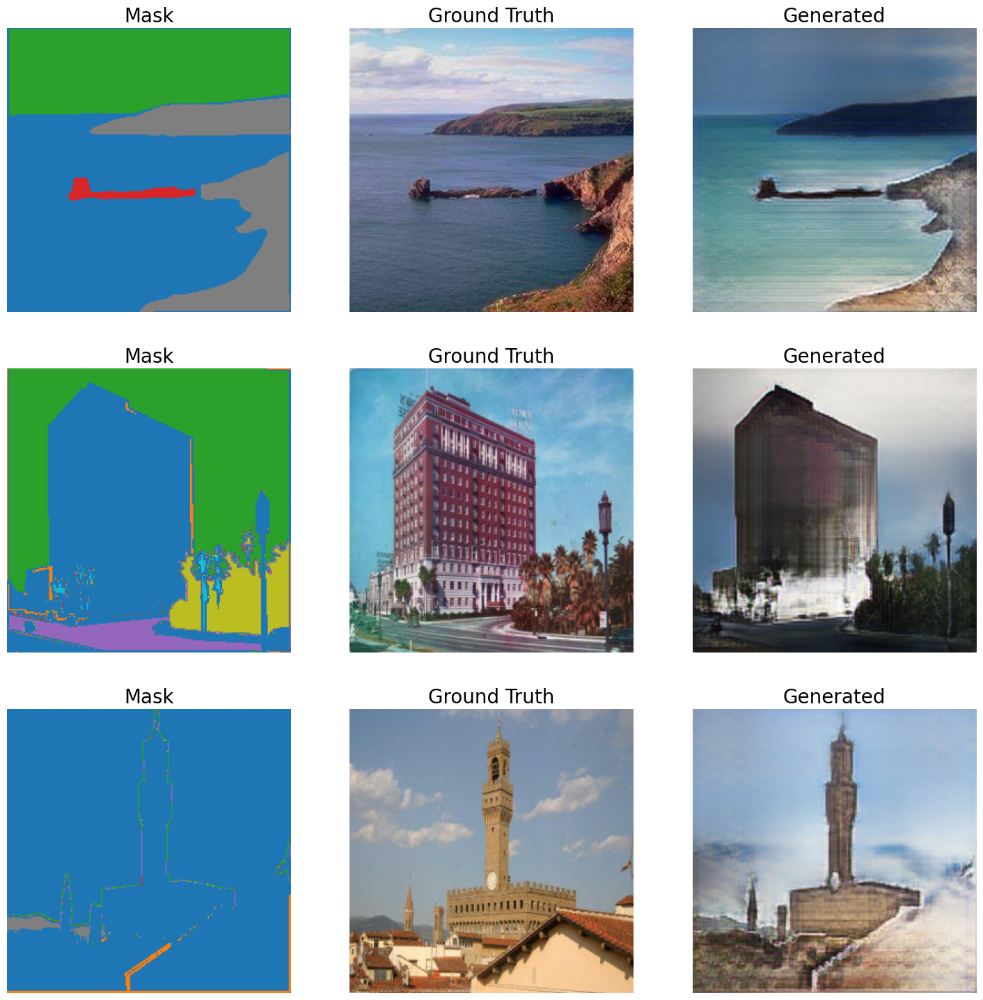

1/1 [==============================] - 0s 57ms/step


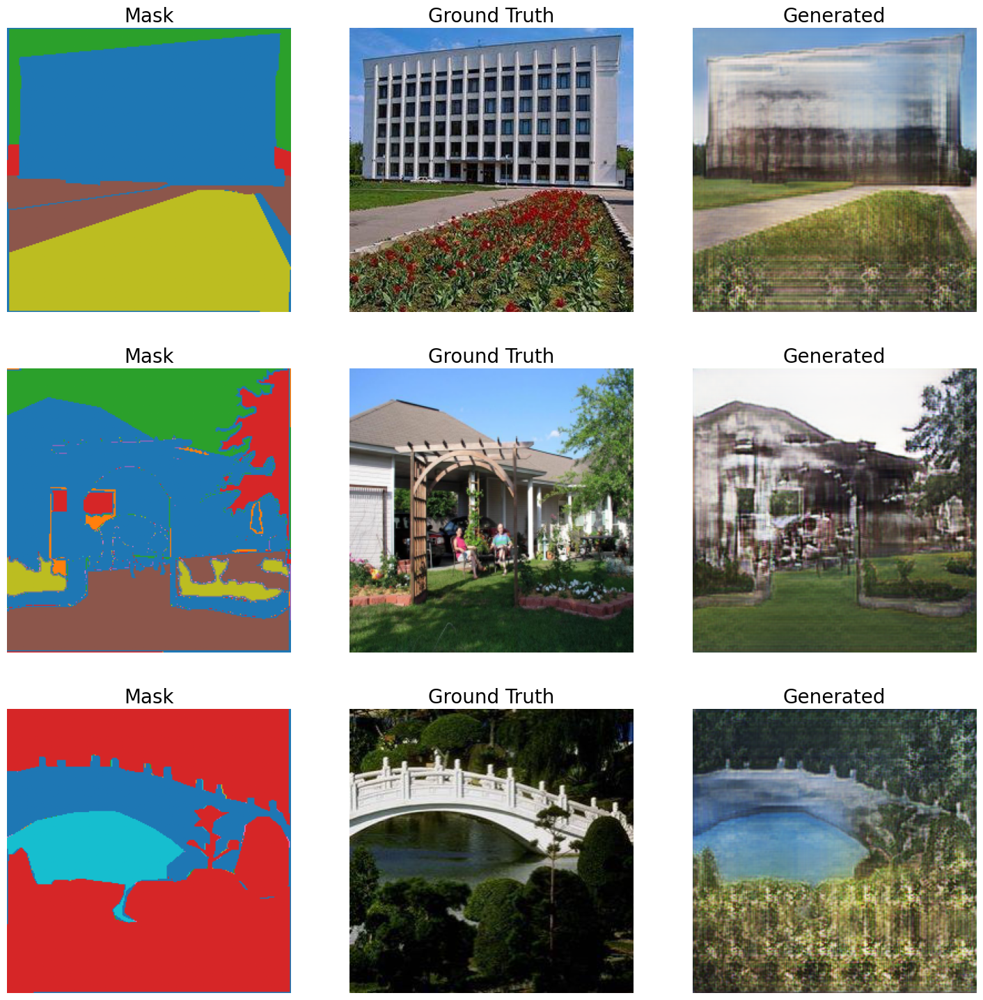

1/1 [==============================] - 0s 35ms/step


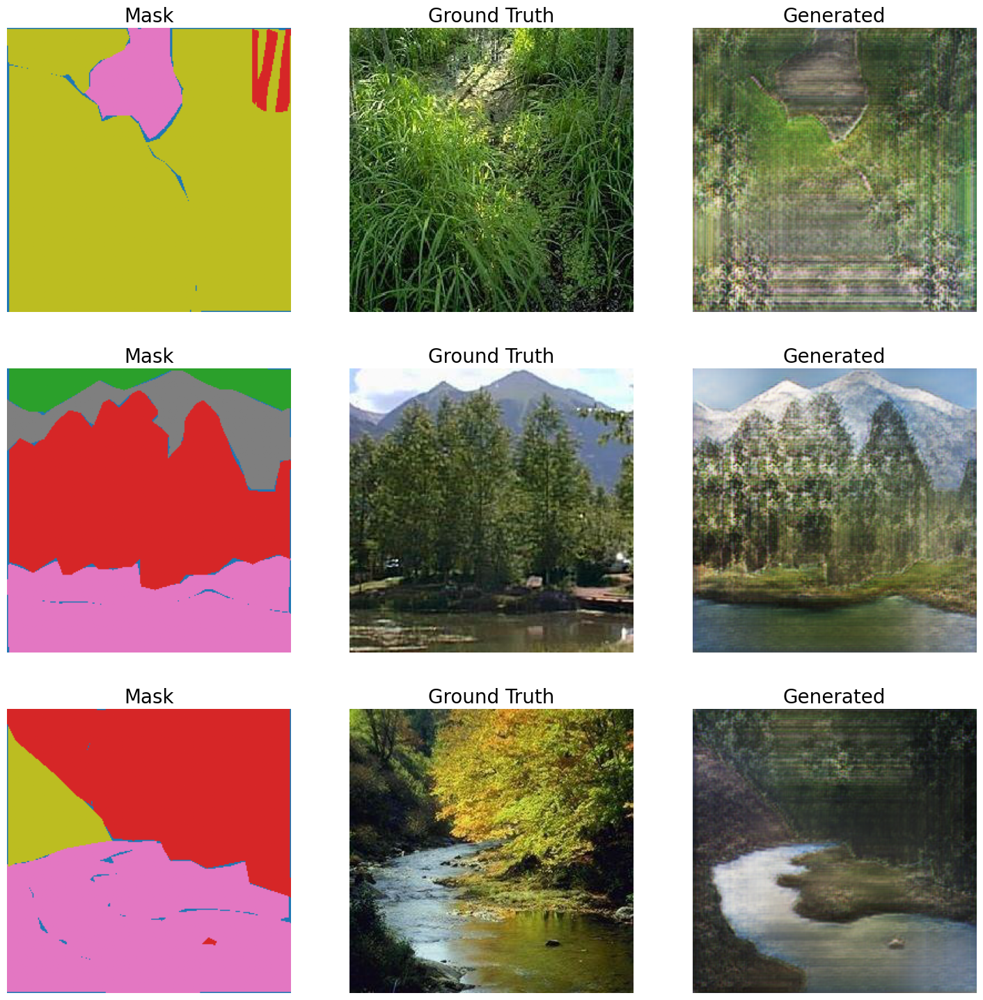

1/1 [==============================] - 0s 37ms/step


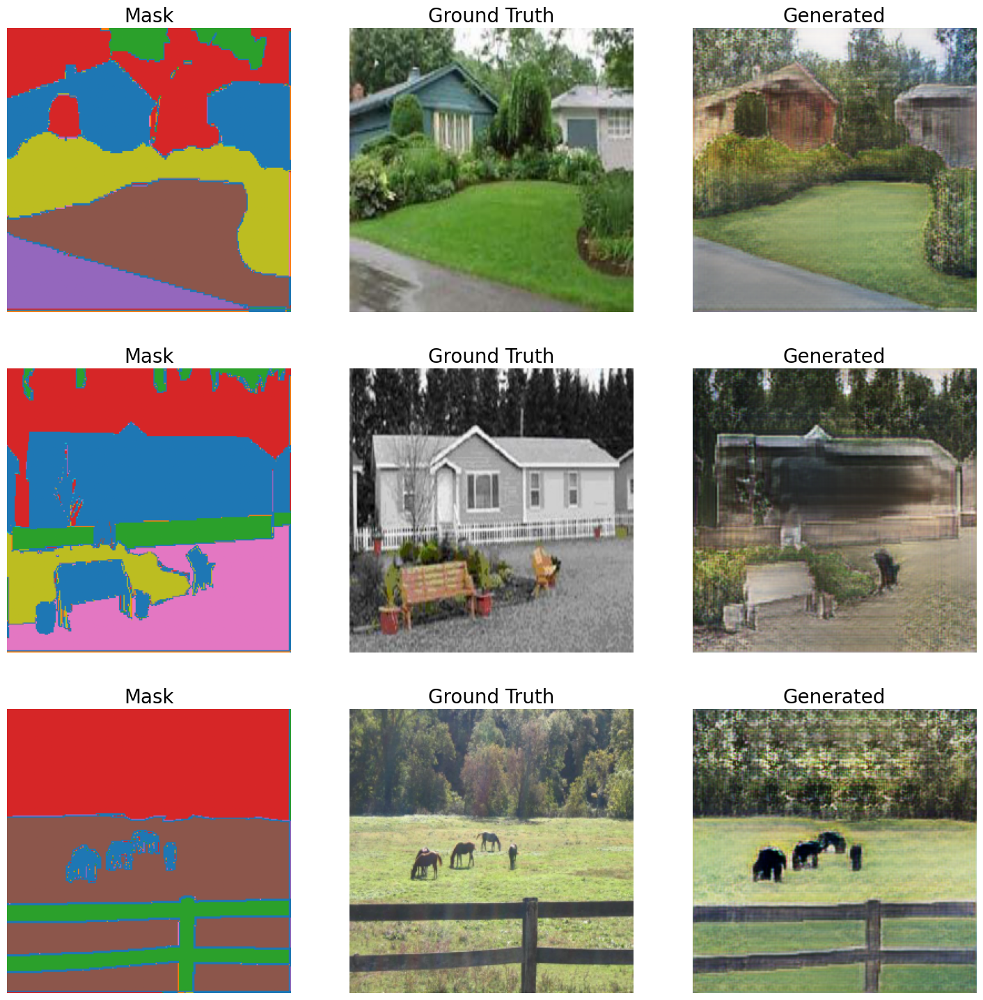

In [19]:
val_iterator = iter(dataset)

for _ in range(5):
    val_images = next(val_iterator)
    # Sample latent from a normal distribution.
    latent_vector = tf.random.normal(
        shape=(gaugan.batch_size, gaugan.latent_dim), mean=0.0, stddev=2.0
    )
    # Generate fake images.
    fake_images = gaugan.predict([latent_vector, val_images[2]])

    real_images = val_images
    grid_row = min(fake_images.shape[0], 3)
    grid_col = 3
    f, axarr = plt.subplots(grid_row, grid_col, figsize=(grid_col * 6, grid_row * 6))
    for row in range(grid_row):
        ax = axarr if grid_row == 1 else axarr[row]
        ax[0].imshow((real_images[0][row] + 1) / 2)
        ax[0].axis("off")
        ax[0].set_title("Mask", fontsize=20)
        ax[1].imshow((real_images[1][row] + 1) / 2)
        ax[1].axis("off")
        ax[1].set_title("Ground Truth", fontsize=20)
        ax[2].imshow((fake_images[row] + 1) / 2)
        ax[2].axis("off")
        ax[2].set_title("Generated", fontsize=20)
    plt.show()